In [8]:
from google.colab import drive
drive.mount('/content/drive')

import shutil
shutil.copytree('/content/drive/MyDrive/LSD_Data', '/content/LSD_Data')

import os
os.listdir('/content/LSD_Data/data.zarr')

Mounted at /content/drive


*  Before starting, click "Runtime" in the top panel, select "Change runtime type" and then choose "GPU"

*  This tutorial follows the inference tutorial, and is therefore condensed. Check out the inference tutorial (**inference.ipynb**) if there is any confusion throughout

*  Try running each cell consecutively to see what is happening before changing things around

*  Some cells are collapsed by default, these are generally utility functions or are expanded by defaullt in a previous tutorial. Double click to expand/collapse

*  sometimes colab can be slow, if this happens you may need to restart the runtime. also, you generally can only run one session at a time.

In [2]:
#@title install packages + repos

# packages
!pip install gunpowder
!pip install matplotlib
!pip install scikit-image
!pip install scipy
!pip install torch
!pip install zarr

# repos
!pip install git+https://github.com/funkelab/funlib.learn.torch.git
!pip install git+https://github.com/funkey/waterz.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.1/206.1 kB 18.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 64.6 MB/s eta 0:00:00
  Created wheel for asciitree: filename=asciitree-0.3.3-py3-none-any.whl size=5034 sha256=8fa7e2a418090210bd76380c9e4f32dc97d023d3bfcca901d5470bbc41689c7b
  Stored in directory: /root/.cache/pip/wheels/7f/4e/be/1171b40f43b918087657ec57cf3b81fa1a2e027d8755baa184
Successfully built asciitree
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pyp

In [3]:
#@title import packages

import gunpowder as gp
import h5py
import io
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import requests
import torch
import waterz
import zarr

from funlib.learn.torch.models import UNet, ConvPass
from gunpowder.torch import Predict
from scipy.ndimage import label, measurements
from scipy.ndimage.filters import maximum_filter
from scipy.ndimage.morphology import distance_transform_edt
from skimage.segmentation import watershed

%matplotlib inline
logging.basicConfig(level=logging.INFO)

<ipython-input-3-dabb17829d75>:20: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import maximum_filter
<ipython-input-3-dabb17829d75>:21: DeprecationWarning: Please use `distance_transform_edt` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt


In [4]:
#@title utility function to view labels

# matplotlib uses a default shader
# we need to recolor as unique objects

def create_lut(labels):

    max_label = np.max(labels)

    lut = np.random.randint(
            low=0,
            high=255,
            size=(int(max_label + 1), 3),
            dtype=np.uint8)

    lut = np.append(
            lut,
            np.zeros(
                (int(max_label + 1), 1),
                dtype=np.uint8) + 255,
            axis=1)

    lut[0] = 0
    colored_labels = lut[labels]

    return colored_labels

In [5]:
import hashlib

def create_lut(labels):
    max_label = np.max(labels)

    lut = np.zeros((int(max_label + 1), 4), dtype=np.uint8)
    lut[:, 3] = 255  # alpha channel

    for label in range(1, int(max_label + 1)):
        # Generate a deterministic RGB color based on label
        md5 = hashlib.md5()
        md5.update(str(label).encode('utf-8'))
        color_hash = md5.hexdigest()
        lut[label, :3] = [int(color_hash[i:i+2], 16) for i in (0, 2, 4)]

    colored_labels = lut[labels]

    return colored_labels

In [ ]:
#@title utility  function to download / save data as zarr

def create_data(
    url,
    name,
    offset,
    resolution,
    sections=None,
    squeeze=True):

  in_f = h5py.File(io.BytesIO(requests.get(url).content), 'r')

  raw = in_f['volumes/raw']
  labels = in_f['volumes/labels/neuron_ids']

  container = zarr.open(name, 'a')

  if sections is None:
    sections=range(raw.shape[0]-1)

  for index, section in enumerate(sections):

    print(f'Writing data for section {section}')

    raw_slice = raw[section]
    labels_slice = labels[section]

    if squeeze:
      raw_slice = np.squeeze(raw_slice)
      labels_slice = np.squeeze(labels_slice)

    for ds_name, data in [
        ('raw', raw_slice),
        ('labels', labels_slice)]:

        container[f'{ds_name}/{index}'] = data
        container[f'{ds_name}/{index}'].attrs['offset'] = offset
        container[f'{ds_name}/{index}'].attrs['resolution'] = resolution

In [7]:
# # get first section
# # Demo data
# create_data(
#     'https://cremi.org/static/data/sample_A_20160501.hdf',
#     'testing_data.zarr',
#     offset=[0,0],
#     resolution=[4,4],
#     sections=[0],
#     squeeze=False)

Writing data for section 0


'/content/LSD_Data'

['volumes', '.zgroup']

In [11]:
#@title Import new data to zarr
import numpy as np
import zarr

def adapt_data(
    file_path,
    name,
    squeeze=True):

  container = zarr.open(file_path, 'r')

  raw = container['volumes/raw']
  labels = container['volumes/labels/neuron_ids']
  pred_affs = container['volumes/pred_affs']

  new_container = zarr.open(name, 'a')

  pred_affs_offset = [x // y for x, y in zip(pred_affs.attrs['offset'], pred_affs.attrs['resolution'])]

  sections = range(raw.shape[0])  # using z dimension of raw

  for index, section in enumerate(sections):

    print(f'Writing data for section {section}')

    # default to a 0 array of the right size if there is no data for this section
    raw_slice = np.zeros((raw.shape[1], raw.shape[2])) if section >= raw.shape[0] else raw[section]
    labels_slice = np.zeros((raw.shape[1], raw.shape[2])) if section >= labels.shape[0] else labels[section]

    # create an empty 3D volume for pred_affs with the same xy shape as raw
    pred_affs_volume = np.zeros((3, raw.shape[1], raw.shape[2]))

    # if this section is within the pred_affs range, then add pred_affs to the corresponding position
    if section >= pred_affs_offset[0] and section - pred_affs_offset[0] < pred_affs.shape[1]:
        pred_affs_slice = pred_affs[:, section - pred_affs_offset[0]]

        # calculate indices for slicing
        y_start, y_end = pred_affs_offset[1], pred_affs_offset[1] + pred_affs_slice.shape[1]
        x_start, x_end = pred_affs_offset[2], pred_affs_offset[2] + pred_affs_slice.shape[2]
        pred_affs_volume[:, y_start:y_end, x_start:x_end] = pred_affs_slice


    if squeeze:
      raw_slice = np.squeeze(raw_slice)
      labels_slice = np.squeeze(labels_slice)
      pred_affs_volume = np.squeeze(pred_affs_volume)

    for ds_name, data in [
        ('raw', raw_slice),
        ('labels', labels_slice),
        ('pred_affs', pred_affs_volume)]:

        new_container[f'{ds_name}/{index}'] = data

  # set attributes for each dataset only once
  for ds_name in ['raw', 'labels', 'pred_affs']:
    if 'offset' in container[f'volumes/{ds_name}'].attrs:
        new_container[f'{ds_name}'].attrs['offset'] = container[f'volumes/{ds_name}'].attrs['offset']

    if 'resolution' in container[f'volumes/{ds_name}'].attrs:
        new_container[f'{ds_name}'].attrs['resolution'] = container[f'volumes/{ds_name}'].attrs['resolution']

# usage:
adapt_data('/content/LSD_Data/data.zarr', 'new_data.zarr', squeeze=False)


Writing data for section 0
Writing data for section 1
Writing data for section 2
Writing data for section 3
Writing data for section 4
Writing data for section 5
Writing data for section 6
Writing data for section 7
Writing data for section 8
Writing data for section 9
Writing data for section 10
Writing data for section 11
Writing data for section 12
Writing data for section 13
Writing data for section 14
Writing data for section 15
Writing data for section 16
Writing data for section 17
Writing data for section 18
Writing data for section 19
Writing data for section 20
Writing data for section 21
Writing data for section 22
Writing data for section 23
Writing data for section 24
Writing data for section 25
Writing data for section 26
Writing data for section 27
Writing data for section 28
Writing data for section 29
Writing data for section 30
Writing data for section 31
Writing data for section 32
Writing data for section 33
Writing data for section 34
Writing data for section 35
Wr

In [12]:
os.listdir()

['.config',
 'testing_data.zarr',
 'drive',
 'LSD_Data',
 'new_data.zarr',
 'sample_data']

In [13]:
new_data = zarr.open('new_data.zarr', 'r')

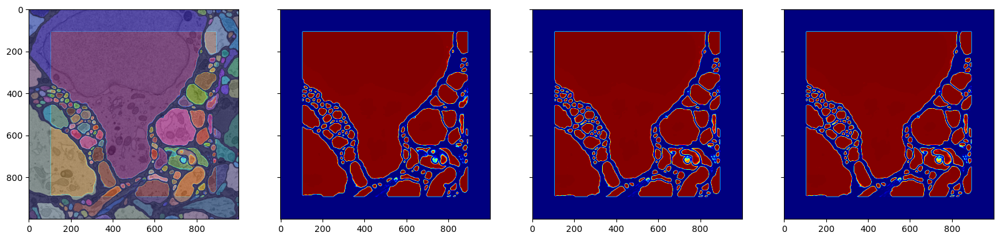

In [14]:
layer = 50

raw = new_data['raw'][str(layer)]
labels = new_data['labels'][str(layer)]
pred_affs = new_data['pred_affs'][str(layer)]

fig, axes = plt.subplots(
            1,
            4,
            figsize=(20, 6),
            sharex=True,
            sharey=True,
            squeeze=False)

# view predictions (for lsds we will just view the mean offset component)
axes[0][0].imshow(raw, cmap='gray')
axes[0][0].imshow(create_lut(np.array(labels)), alpha=0.5)
axes[0][0].imshow(np.squeeze(pred_affs[0]), cmap='jet', alpha=0.3)
axes[0][1].imshow(np.squeeze(pred_affs[0]), cmap='jet')
axes[0][2].imshow(np.squeeze(pred_affs[1]), cmap='jet')
axes[0][3].imshow(np.squeeze(pred_affs[2]), cmap='jet')

# axes[0][0].imshow(create_lut(np.squeeze(segmentation)), alpha=0.7)


In [15]:
#@title inference wrapper
voxel_size = gp.Coordinate((4, 4))

input_shape = gp.Coordinate((164, 164))
output_shape = gp.Coordinate((124, 124))

input_size = input_shape * voxel_size
output_size = output_shape * voxel_size

# total roi of image to predict on
total_roi = gp.Coordinate((1250,1250))*voxel_size

num_fmaps=12

class MtlsdModel(torch.nn.Module):

    def __init__(self):
        super().__init__()

        self.unet = UNet(
            in_channels=1,
            num_fmaps=num_fmaps,
            fmap_inc_factor=5,
            downsample_factors=[
                [2, 2],
                [2, 2]],
            kernel_size_down=[
                [[3, 3], [3, 3]],
                [[3, 3], [3, 3]],
                [[3, 3], [3, 3]]],
            kernel_size_up=[
                [[3, 3], [3, 3]],
                [[3, 3], [3, 3]]])

        self.lsd_head = ConvPass(num_fmaps, 6, [[1, 1]], activation='Sigmoid')
        self.aff_head = ConvPass(num_fmaps, 2, [[1, 1]], activation='Sigmoid')

    def forward(self, input):

        z = self.unet(input)
        lsds = self.lsd_head(z)
        affs = self.aff_head(z)

        return lsds, affs

def predict(
    checkpoint,
    raw_file,
    raw_dataset):

  raw = gp.ArrayKey('RAW')
  pred_lsds = gp.ArrayKey('PRED_LSDS')
  pred_affs = gp.ArrayKey('PRED_AFFS')

  scan_request = gp.BatchRequest()

  scan_request.add(raw, input_size)
  scan_request.add(pred_lsds, output_size)
  scan_request.add(pred_affs, output_size)

  context = (input_size - output_size) / 2

  source = gp.ZarrSource(
              raw_file,
          {
              raw: raw_dataset
          },
          {
              raw: gp.ArraySpec(interpolatable=True)
          })

  with gp.build(source):
    total_input_roi = source.spec[raw].roi
    total_output_roi = source.spec[raw].roi.grow(-context,-context)

  model = MtlsdModel()

  # set model to eval mode
  model.eval()

  # add a predict node
  predict = gp.torch.Predict(
      model=model,
      checkpoint=checkpoint,
      inputs = {
                'input': raw
      },
      outputs = {
          0: pred_lsds,
          1: pred_affs})

  # this will scan in chunks equal to the input/output sizes of the respective arrays
  scan = gp.Scan(scan_request)

  pipeline = source
  pipeline += gp.Normalize(raw)

  # raw shape = h,w

  pipeline += gp.Unsqueeze([raw])

  # raw shape = c,h,w

  pipeline += gp.Stack(1)

  # raw shape = b,c,h,w

  pipeline += predict
  pipeline += scan
  pipeline += gp.Squeeze([raw])

  # raw shape = c,h,w
  # pred_lsds shape = b,c,h,w
  # pred_affs shape = b,c,h,w

  pipeline += gp.Squeeze([raw, pred_lsds, pred_affs])

  # raw shape = h,w
  # pred_lsds shape = c,h,w
  # pred_affs shape = c,h,w

  predict_request = gp.BatchRequest()

  # this lets us know to process the full image. we will scan over it until it is done
  predict_request.add(raw, total_input_roi.get_end())
  predict_request.add(pred_lsds, total_output_roi.get_end())
  predict_request.add(pred_affs, total_output_roi.get_end())

  with gp.build(pipeline):
      batch = pipeline.request_batch(predict_request)

  return batch[raw].data, batch[pred_lsds].data, batch[pred_affs].data

In [16]:
# fetch checkpoint
!wget https://www.dropbox.com/s/r1u8pvji5lbanyq/model_checkpoint_50000

--2023-06-15 04:24:36--  https://www.dropbox.com/s/r1u8pvji5lbanyq/model_checkpoint_50000
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/r1u8pvji5lbanyq/model_checkpoint_50000 [following]
--2023-06-15 04:24:36--  https://www.dropbox.com/s/raw/r1u8pvji5lbanyq/model_checkpoint_50000
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc27d589f98355d718a3e998a226.dl.dropboxusercontent.com/cd/0/inline/B-DB08tv4nv-HSGza1T2rCZ4UfchFGcIXBlL9ownhBEeajLMoLGfHriAGOtpxvSn-iRzsFW5yBLA0YfK1moKGxxyc_TtZEof4GDGZbPJXz3aJEmuNFd_5XMNBfC9ACm9idU-uvLJZvKvZZsTU1iWGttsGNLrTg6vrkTx2w18i1r6wA/file# [following]
--2023-06-15 04:24:36--  https://uc27d589f98355d718a3e998a226.dl.dropboxusercontent.com/cd/0/inline/B-DB08tv4nv-HSGza1T2rCZ4UfchFGcIXBlL9ownhBEeajLMoL

In [17]:
checkpoint = 'model_checkpoint_50000'
raw_file = 'testing_data.zarr'
raw_dataset = 'raw/0'

raw, pred_lsds, pred_affs = predict(checkpoint, raw_file, raw_dataset)

100%|██████████| 100/100 [00:13<00:00,  7.46it/s]


In [18]:
np.std(pred_affs[0])

0.38177298024508277

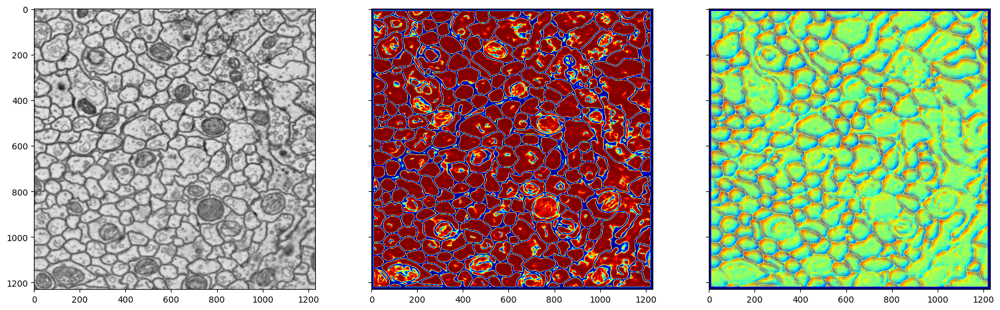

In [19]:
fig, axes = plt.subplots(
            1,
            3,
            figsize=(20, 6),
            sharex=True,
            sharey=True,
            squeeze=False)

# view predictions (for lsds we will just view the mean offset component)
axes[0][0].imshow(raw, cmap='gray')
axes[0][1].imshow(np.squeeze(pred_affs[0]), cmap='jet')
axes[0][2].imshow(np.squeeze(pred_lsds[0]), cmap='jet')
axes[0][2].imshow(np.squeeze(pred_lsds[1]), cmap='jet', alpha=0.5)

In [20]:
#@title watershed wrappers
def watershed_from_boundary_distance(
        boundary_distances,
        boundary_mask,
        id_offset=0,
        min_seed_distance=10):

    max_filtered = maximum_filter(boundary_distances, min_seed_distance)
    maxima = max_filtered==boundary_distances
    seeds, n = label(maxima)

    print(f"Found {n} fragments")

    if n == 0:
        return np.zeros(boundary_distances.shape, dtype=np.uint64), id_offset

    seeds[seeds!=0] += id_offset

    fragments = watershed(
        boundary_distances.max() - boundary_distances,
        seeds,
        mask=boundary_mask)

    ret = (fragments.astype(np.uint64), n + id_offset)

    return ret

def watershed_from_affinities(
        affs,
        max_affinity_value=1.0,
        id_offset=0,
        min_seed_distance=10):

    mean_affs = 0.5*(affs[1] + affs[2])

    fragments = np.zeros(mean_affs.shape, dtype=np.uint64)

    boundary_mask = mean_affs>0.5*max_affinity_value
    boundary_distances = distance_transform_edt(boundary_mask)

    ret = watershed_from_boundary_distance(
        boundary_distances,
        boundary_mask,
        id_offset=id_offset,
        min_seed_distance=min_seed_distance)

    return ret

In [21]:
#@title segmentation wrapper
def get_segmentation(affinities, threshold):

    fragments = watershed_from_affinities(affinities)[0]

    thresholds = [threshold]

    generator = waterz.agglomerate(
        affs=affinities.astype(np.float32),
        fragments=fragments,
        thresholds=thresholds,
    )

    segmentation = next(generator)

    return segmentation

In [22]:
# watershed assumes 3d arrays, create fake channel dim (call these watershed affs - ws_affs)
ws_affs = np.stack([
    np.zeros_like(pred_affs[0]),
    pred_affs[0],
    pred_affs[1]]
)

# affs shape: 3, h, w

# waterz agglomerate requires 4d affs (c, d, h, w) - add fake z dim
ws_affs = np.expand_dims(ws_affs, axis=1)

#affs shape: 3, 1, h, w

#just test a 0.5 threshold. higher thresholds will merge more, lower thresholds will split more
threshold = 0.5

segmentation = get_segmentation(ws_affs, threshold)
print('segmentation.shape', segmentation.shape)

Found 1801 fragments
Compiling waterz in /root/.cython/inline


/usr/local/lib/python3.10/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /root/.cython/inline/waterz_4b36b8557718566140dbbc756ac40f7e.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)


Preparing segmentation volume...
segmentation.shape (1, 1230, 1230)


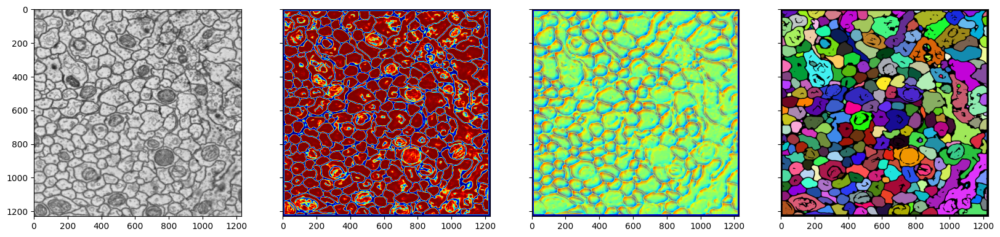

In [23]:
fig, axes = plt.subplots(
            1,
            4,
            figsize=(20, 6),
            sharex=True,
            sharey=True,
            squeeze=False)

# view predictions (for lsds we will just view the mean offset component)
axes[0][0].imshow(raw, cmap='gray')
axes[0][1].imshow(np.squeeze(pred_affs[0]), cmap='jet')
axes[0][2].imshow(np.squeeze(pred_lsds[0]), cmap='jet')
axes[0][2].imshow(np.squeeze(pred_lsds[1]), cmap='jet', alpha=0.5)
axes[0][3].imshow(create_lut(np.squeeze(segmentation)))

In [24]:
# Pre-allocate a numpy array of the correct shape
pred_affs_4d = np.zeros((3, 100, 1000, 1000), dtype='float64')

# Iterate over each section and store the corresponding data into the numpy array
for z in range(100):
    pred_affs_4d[:, z, :, :] = new_data['pred_affs'][str(z)]

# Values are between 0 and 255. Normalize between 0 and 1
pred_affs_4d = pred_affs_4d / 255.0

pred_affs_4d.shape


(3, 100, 1000, 1000)

In [25]:
layer_20 = pred_affs_4d[:, 20, :]
layer_20[0, 200:, 200:]

array([[0.99607843, 0.99607843, 0.99607843, ..., 0.        , 0.        ,
        0.        ],
       [0.99607843, 0.99607843, 0.99607843, ..., 0.        , 0.        ,
        0.        ],
       [0.99607843, 0.99607843, 0.99607843, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


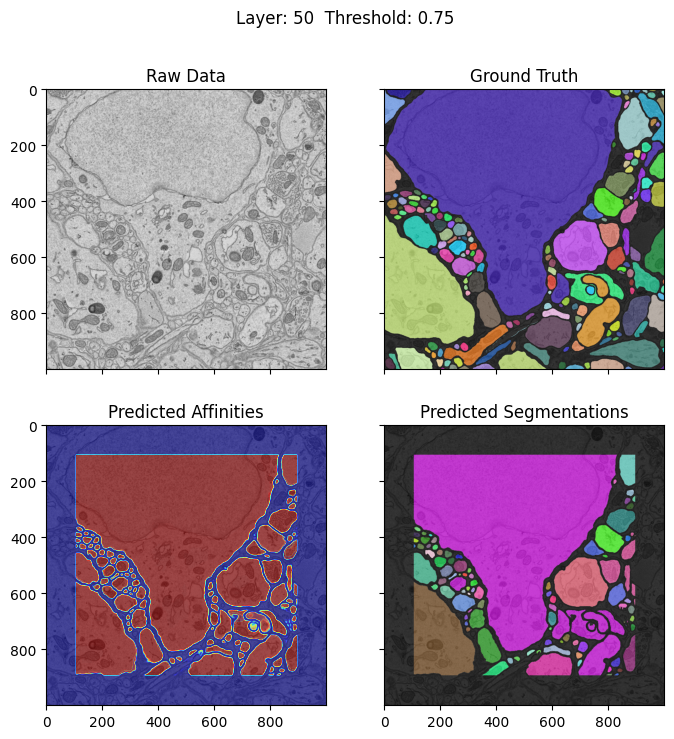

In [26]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_results(new_data, pred_affs_4d, layer, threshold):
    # Calculate the segmentation
    # higher thresholds will merge more, lower thresholds will split more
    segmentation = get_segmentation(pred_affs_4d, threshold)
    print('segmentation.shape', segmentation.shape)

    # Extract the predicted affinities for the specified layer
    pred_affs = pred_affs_4d[:, layer, :]

    # Get the raw, labels, and other data
    raw = new_data['raw'][str(layer)]
    labels = new_data['labels'][str(layer)]

    # Create subplots for visualization
    fig, axes = plt.subplots(2, 2, figsize=(8, 8), sharex=True, sharey=True, squeeze=False)

    # View predictions (for LSDS we will just view the mean offset component)
    axes[0][0].imshow(raw, cmap='gray')
    axes[0][0].set_title(f"Raw Data")
    # axes[0][0].text(0.5, -0.15, f"Layer: {layer}", transform=axes[0][0].transAxes, ha='center')

    axes[0][1].imshow(raw, cmap='gray')
    axes[0][1].imshow(create_lut(np.squeeze(labels)), alpha=0.75)
    axes[0][1].set_title("Ground Truth")

    axes[1][0].imshow(raw, cmap='gray')
    axes[1][0].imshow(np.squeeze(pred_affs[0]), cmap='jet', alpha=0.3)
    axes[1][0].imshow(np.squeeze(pred_affs[1]), cmap='jet', alpha=0.3)
    axes[1][0].imshow(np.squeeze(pred_affs[2]), cmap='jet', alpha=0.3)
    axes[1][0].set_title("Predicted Affinities")


    axes[1][1].imshow(raw, cmap='gray')
    axes[1][1].imshow(create_lut(np.squeeze(segmentation[layer, :])), alpha=0.75)
    axes[1][1].set_title("Predicted Segmentations")
    # axes[1][1].text(0.5, -0.15, f"Threshold: {threshold}", transform=axes[1][0].transAxes, ha='center')

    # Set the title for the entire figure
    plt.suptitle(f"Layer: {layer}  Threshold: {threshold}")

    plt.show()

visualize_results(new_data, pred_affs_4d, 50, 0.75)


Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


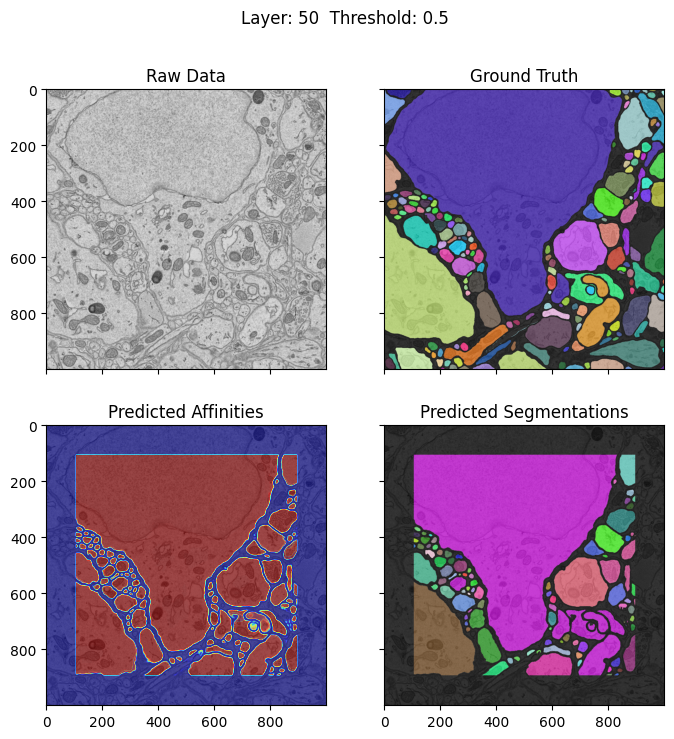

In [84]:
visualize_results(new_data, pred_affs_4d, 50, 0.5)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


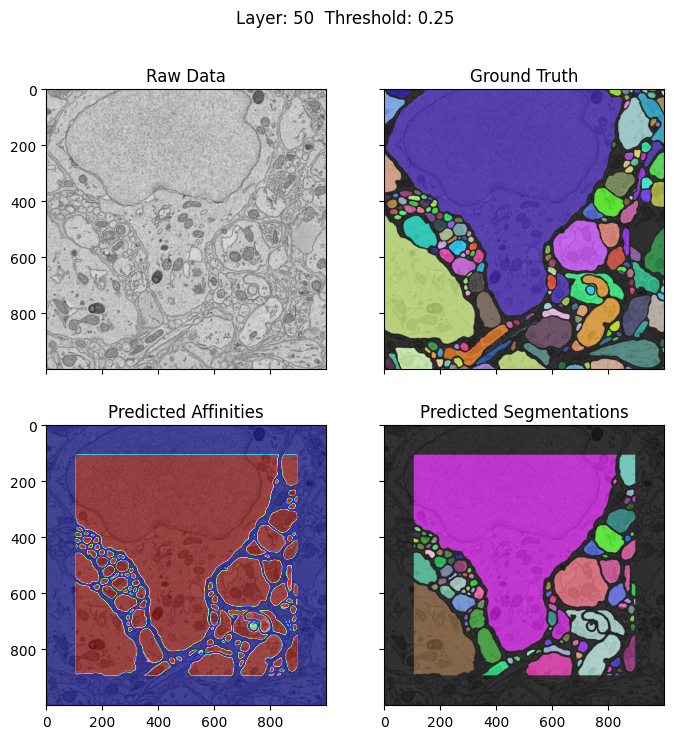

In [85]:
visualize_results(new_data, pred_affs_4d, 50, 0.25)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


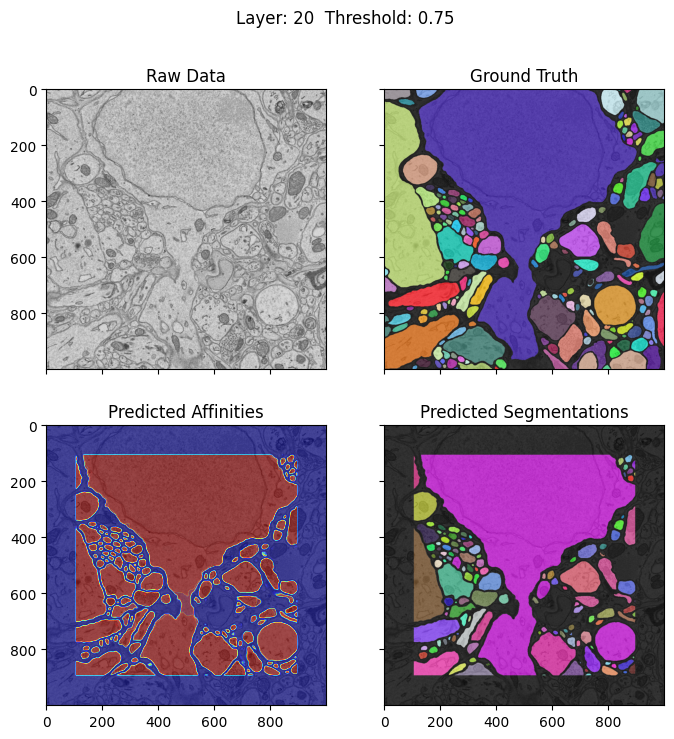

In [86]:
visualize_results(new_data, pred_affs_4d, 20, 0.75)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


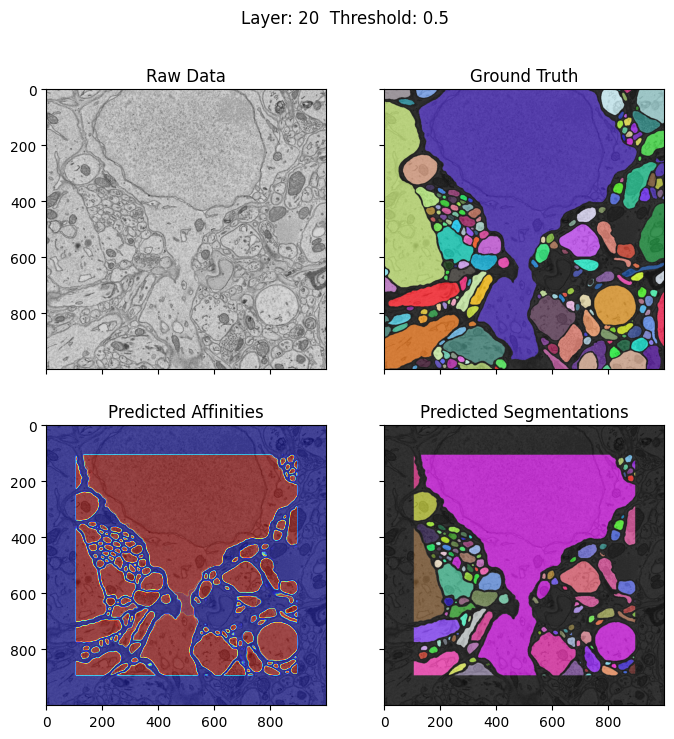

In [87]:
visualize_results(new_data, pred_affs_4d, 20, 0.5)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


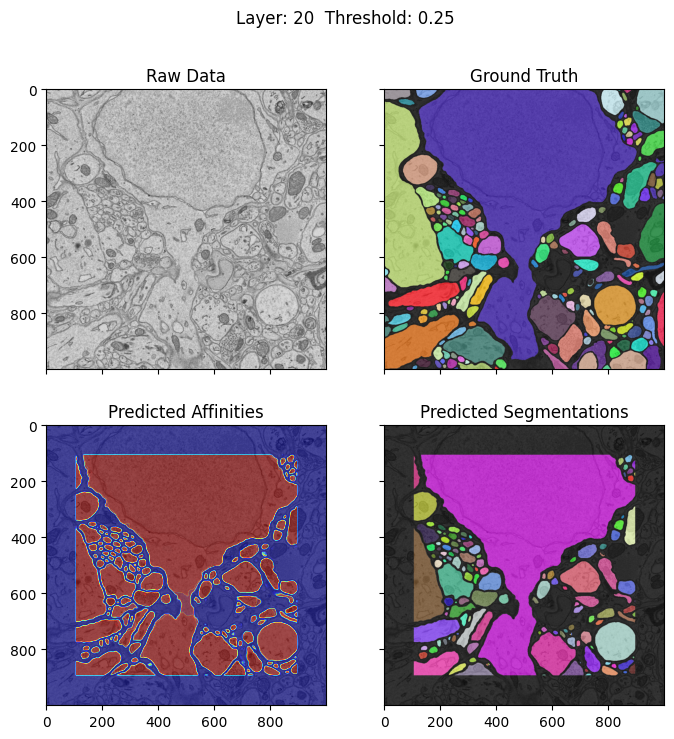

In [88]:
visualize_results(new_data, pred_affs_4d, 20, 0.25)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


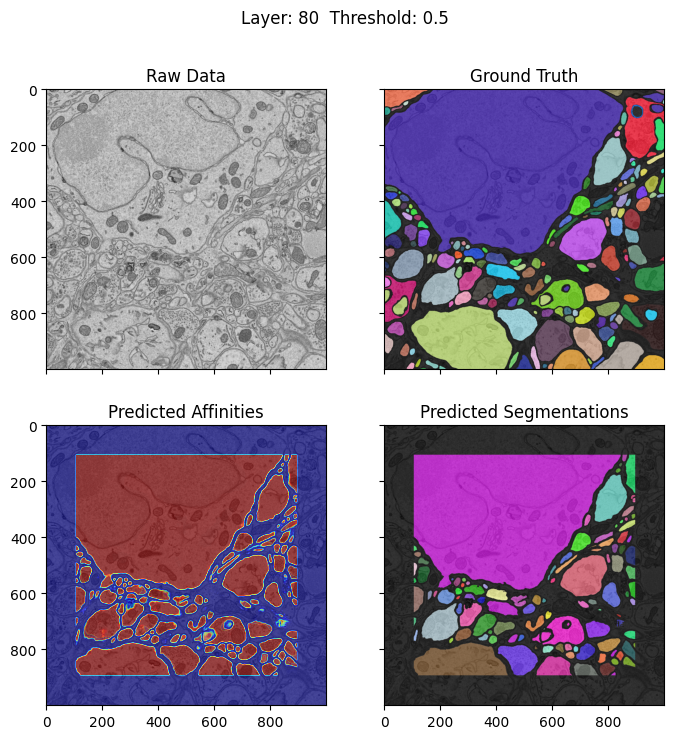

In [89]:
visualize_results(new_data, pred_affs_4d, 80, 0.5)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


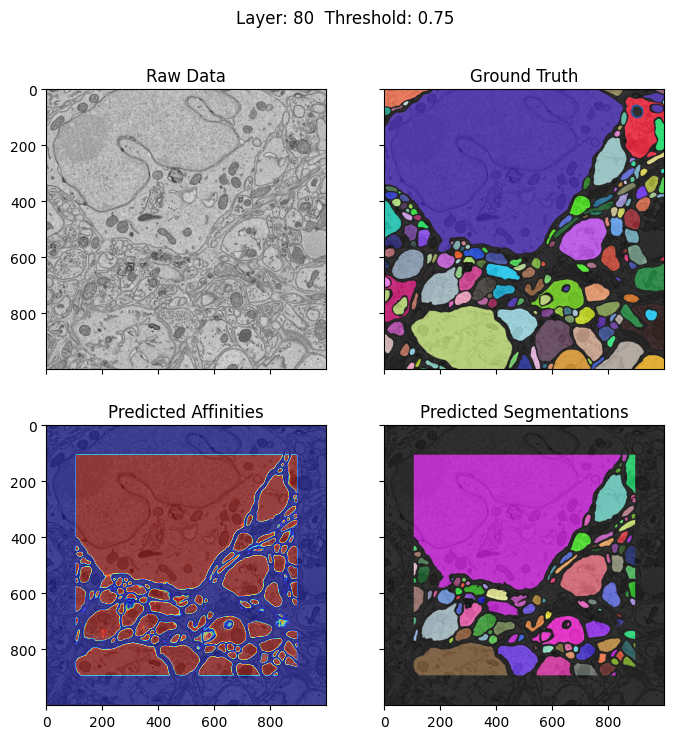

In [90]:
visualize_results(new_data, pred_affs_4d, 80, 0.75)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...
segmentation.shape (100, 1000, 1000)


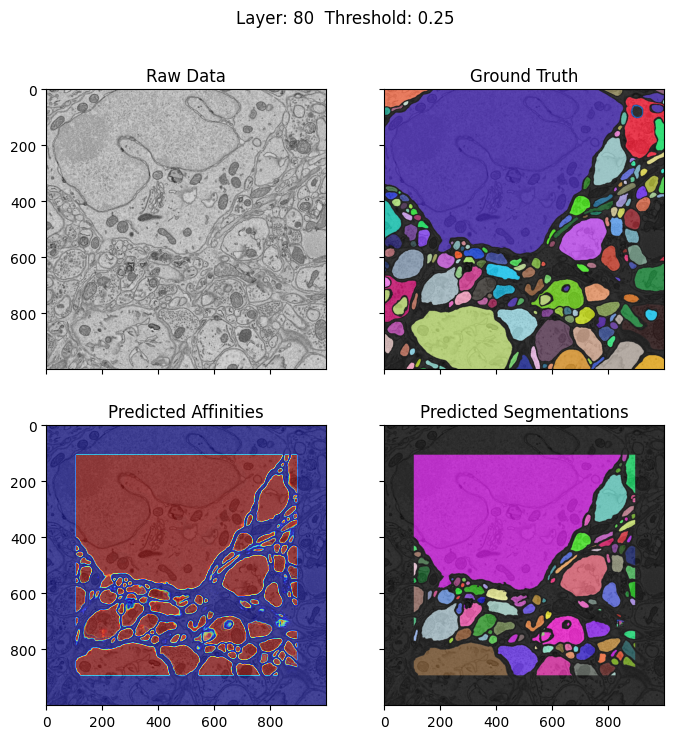

In [91]:
visualize_results(new_data, pred_affs_4d, 80, 0.25)

In [28]:
segmentation = get_segmentation(pred_affs_4d, 0.5)

Found 5246 fragments
Re-using already compiled waterz version
Preparing segmentation volume...


In [29]:
segmentation.shape

(100, 1000, 1000)

In [31]:
data = zarr.open('/content/LSD_Data/data.zarr', 'r')
data['/volumes/pred_affs']

<zarr.core.Array '/volumes/pred_affs' (3, 64, 788, 788) uint8 read-only>

In [30]:
# Pre-allocate a numpy array of the correct shape
labels_3d = np.zeros((100, 1000, 1000), dtype='float64')

# Iterate over each section and store the corresponding data into the numpy array
for z in range(100):
    labels_3d[z, :, :] = new_data['labels'][str(z)]


labels_3d.shape

(100, 1000, 1000)

In [32]:
import numpy as np

# offsets = [x // y for x,y in zip(new_data['pred_affs'].attrs['offset'], new_data['pred_affs'].attrs['resolution'])]
# Assuming `array_3d` is your original 3D array
offset = (18, 106, 106)
dimensions = (64, 788, 788)

# Calculate the starting and ending indices for each dimension
start_indices = [offset[i] for i in range(3)]
end_indices = [offset[i] + dimensions[i] for i in range(3)]

# Extract the subset of the array
labels_crop = labels_3d[start_indices[0]:end_indices[0], start_indices[1]:end_indices[1], start_indices[2]:end_indices[2]]
segments_crop = segmentation[start_indices[0]:end_indices[0], start_indices[1]:end_indices[1], start_indices[2]:end_indices[2]]

print(segments_crop.shape)

(64, 788, 788)


In [33]:
labels_3d_binarized = np.where(labels_crop != 0, 1, 0)
segmentation_binarized = np.where(segments_crop != 0, 1, 0)

In [34]:
def calculate_jaccard_index(seg1, seg2):
    intersection = np.logical_and(seg1, seg2).sum()
    union = np.logical_or(seg1, seg2).sum()

    # Handle division by zero case
    if union == 0:
        jaccard_index = 0.0
    else:
        jaccard_index = intersection / union

    return jaccard_index

calculate_jaccard_index(labels_3d_binarized, segmentation_binarized)

0.9577383344090644

In [ ]:
# Initialize the pixel_rank dictionary
from collections import defaultdict

pixel_rank = defaultdict(lambda: defaultdict(int))

# Populate the pixel_rank dictionary
for i in range(segmentation.shape[0]):
    print(f'Layer: {i}', end='\r')
    for j in range(segmentation.shape[1]):
        for k in range(segmentation.shape[2]):
            segment_label = segmentation[i, j, k]
            ground_truth_label = labels_3d[i, j, k]
            pixel_rank[segment_label][ground_truth_label] += 1


In [56]:
# Initialize the pixel_rank dictionary
from collections import defaultdict

pixel_rank = defaultdict(lambda: defaultdict(int))

# Populate the pixel_rank dictionary
for i in range(segmentation.shape[0]):
    if i % 10 == 0:
      print(i)
    for j in range(segmentation.shape[1]):
        for k in range(segmentation.shape[2]):
            segment_label = segmentation[i, j, k]
            ground_truth_label = labels_3d[i, j, k]
            pixel_rank[segment_label][ground_truth_label] += 1


In [57]:
pixel_rank[0] = defaultdict(int)
pixel_rank[0][0] = 1000

In [61]:
pixel_rank[0]

[(0, 1000)]

In [ ]:
# Sort the lists of ground truth labels for each predicted label
for segment_label in pixel_rank:
    pixel_rank[segment_label] = sorted(pixel_rank[segment_label].items(), key=lambda x: x[1], reverse=True)


In [65]:
from pandas._libs.lib import to_object_array_tuples
import time


segment_gt_mapping = {}
# Compute IoU or Dice Coefficient for each pair of labels
total = len(pixel_rank)
for i, segment_label in enumerate(pixel_rank):
    start = time.time()

    if segment_label == 0:
        segment_gt_mapping[0] = (0, 1)

    top_score = 0
    top_label = 0
    pairs = len(pixel_rank[segment_label])
    for gt_label, count in pixel_rank[segment_label]:
        gt_mask = np.where(labels_crop == gt_label, 1, 0)
        seg_mask = np.where(segments_crop == segment_label, 1, 0)

        # Compute IoU or Dice Coefficient
        iou = calculate_jaccard_index(gt_mask, seg_mask)
        # If the metric value is high enough, consider this pair as a match
        if iou > top_score:
            top_score = max(top_score, iou)
            top_label = gt_label

    # Set segmentation value to predicted ground truth label
    segment_gt_mapping[segment_label] = (top_label, top_score)
    end = time.time()
    print(f'({i}/{total}) segment: {segment_label}, # pairs: {pairs} top: {top_label}, score: {top_score}, elapsed: {end-start}')


segment_gt_mapping


(0/264) segment: 0, # pairs: 1 top: 0, score: 0.8521168723039803, elapsed: 0.5071079730987549
(1/264) segment: 2, # pairs: 2 top: 22.0, score: 0.00237548239288069, elapsed: 1.0093722343444824
(2/264) segment: 12, # pairs: 8 top: 41.0, score: 0.9314659950494503, elapsed: 3.9350132942199707
(3/264) segment: 3, # pairs: 1 top: 141.0, score: 0.6673913043478261, elapsed: 0.4920163154602051
(4/264) segment: 105, # pairs: 2 top: 5.0, score: 0.7769379844961241, elapsed: 0.999445915222168
(5/264) segment: 4, # pairs: 1 top: 154.0, score: 0.3055555555555556, elapsed: 0.49935388565063477
(6/264) segment: 7, # pairs: 1 top: 7.0, score: 0.1030167597765363, elapsed: 0.4934365749359131
(7/264) segment: 108, # pairs: 2 top: 15.0, score: 0.7543940795559667, elapsed: 0.990440845489502
(8/264) segment: 9, # pairs: 2 top: 9.0, score: 0.6863154234046253, elapsed: 0.9883646965026855
(9/264) segment: 113, # pairs: 2 top: 225.0, score: 0.8087924801156905, elapsed: 0.9890086650848389
(10/264) segment: 115, # p

{0: (0, 0.8521168723039803),
 2: (22.0, 0.00237548239288069),
 12: (41.0, 0.9314659950494503),
 3: (141.0, 0.6673913043478261),
 105: (5.0, 0.7769379844961241),
 4: (154.0, 0.3055555555555556),
 7: (7.0, 0.1030167597765363),
 108: (15.0, 0.7543940795559667),
 9: (9.0, 0.6863154234046253),
 113: (225.0, 0.8087924801156905),
 115: (144.0, 0.5085924713584288),
 10: (11.0, 0.6367265469061876),
 117: (12.0, 0.7269410095276708),
 14: (279.0, 0.9394792652679759),
 40: (281.0, 0.4276679275903629),
 384: (16.0, 0.06251446201311223),
 125: (247.0, 0.9212718741127068),
 15: (19.0, 0.8139301820611324),
 18: (22.0, 0.979956998484315),
 19: (306.0, 0.8878297757271544),
 20: (25.0, 0.7752529441034998),
 134: (155.0, 0.7382528127068166),
 779: (23.0, 0.7482819383259912),
 21: (21.0, 0.8814408297579872),
 23: (27.0, 0.7611625947767481),
 582: (28.0, 0.6474391696443764),
 485: (30.0, 0.8095151211056881),
 144: (26.0, 0.6966457983407136),
 24: (33.0, 0.6640126192443476),
 146: (36.0, 0.8361438313701178),

In [81]:
import numpy as np
from sklearn.metrics.cluster import mutual_info_score

def entropy(x):
    """Compute entropy for a segmentation."""
    unique, counts = np.unique(x, return_counts=True)
    prob = counts / np.sum(counts)
    return -np.sum(prob * np.log2(prob))

def variation_of_information(x, y):
    """Compute VOI for two segmentations."""
    return entropy(x) + entropy(y) - 2 * mutual_info_score(x.ravel(), y.ravel())


In [82]:
import time
def calculate_all_voi(segment_gt_mapping, labels_crop, segments_crop):
    # Initialize an empty dictionary to store VOI for each pair
    voi_scores = {}

    # Iterate over each segment label
    for segment_label in segment_gt_mapping:
        start = time.time()
        # Get the ground truth label for this segment label
        gt_label = segment_gt_mapping[segment_label][0]

        # Create binary masks
        gt_mask = np.where(labels_crop == gt_label, 1, 0)
        seg_mask = np.where(segments_crop == segment_label, 1, 0)

        # Calculate VOI and store in the dictionary
        voi_scores[segment_label] = variation_of_information(gt_mask, seg_mask)
        end = time.time()
        print(segment_label, voi_scores[segment_label], end-start)

    return voi_scores

voi = calculate_all_voi(segment_gt_mapping, labels_crop, segments_crop)

0 0.7065986536347802 10.430289506912231
2 0.3719196742577232 10.383933067321777
12 0.8970287467018245 10.4138662815094
3 0.00016625642181241634 10.440709829330444
105 0.0026760003158188394 10.442626714706421
4 1.8123229905284354e-05 10.465859651565552
7 0.004388399054945985 10.430745124816895
108 0.0006585560118829625 10.440174341201782
9 0.003126524981066392 10.52243709564209
113 0.007726719218876571 10.419784545898438
115 0.0008422857204102303 10.480714797973633
10 0.00018293085549765388 10.4793062210083
117 0.0014170999581656217 10.402210474014282
14 0.014724803123250144 10.422924041748047
40 0.10153666552785416 10.420340538024902
384 0.020669542759132416 10.447534561157227
125 0.040980661314096806 10.449236869812012
15 0.0015952232339144518 10.440497159957886
18 0.24367456584137243 10.442676305770874
19 0.011561680174192592 10.470299005508423
20 0.003105920554118448 10.500589370727539
134 0.0017097423916336459 10.509907245635986
779 0.0029816910138678074 10.483061790466309
21 0.017

In [96]:
sum(voi.values())

52.08929144109636

In [97]:
sum(voi.values()) / 500

0.10417858288219271

In [83]:
import pickle

!mkdir "/content/drive/My Drive/pickle_files"
# Path to the pickle file in your Google Drive
pickle_file_path = '/content/drive/My Drive/pickle_files/'

# Save the variables using pickle
with open(pickle_file_path + 'segment_gt_mapping', 'wb') as file:
    pickle.dump((segment_gt_mapping), file)

In [67]:
import numpy as np

def remap_labels(segment_volume, segment_gt_mapping):
    # Initialize an empty volume with the same shape as the input volume
    updated_segment_volume = np.zeros_like(segment_volume)

    # Iterate over all unique labels in the input volume
    for segment_label in np.unique(segment_volume):
        # If this label has a mapping in the dictionary, apply it
        if segment_label in segment_gt_mapping:
            ground_truth_label, _ = segment_gt_mapping[segment_label]
            updated_segment_volume[segment_volume == segment_label] = ground_truth_label
        else:
            # If no mapping is found, you might choose to leave these pixels as 0,
            # or give them a new unique label, depending on your use case.
            pass

    return updated_segment_volume

segments_crop_map = remap_labels(segments_crop, segment_gt_mapping)
segments_crop_map.shape

(64, 788, 788)

In [72]:
segments_crop_map[10,:]

array([[ 41,  41,  41, ...,   0,   0,   0],
       [ 41,  41,  41, ...,   0,   0,   0],
       [ 41,  41,  41, ...,   0,   0,   0],
       ...,
       [257, 257, 257, ..., 115, 115, 115],
       [257, 257, 257, ..., 115, 115, 115],
       [257, 257, 257, ...,   0,   0,   0]], dtype=uint64)

In [73]:
labels_crop[10,:]

array([[ 41.,  41.,  41., ...,   0.,   0.,   0.],
       [ 41.,  41.,  41., ...,   0.,   0.,   0.],
       [ 41.,  41.,  41., ...,   0.,   0.,   0.],
       ...,
       [257., 257., 257., ..., 115., 115., 115.],
       [257., 257., 257., ..., 115., 115., 115.],
       [257., 257., 257., ..., 115., 115., 115.]])

In [78]:
100*50 * 1000*10 * 1000*10 # nm^3
# 500000000000 nm^3 = 500 um^3

[500000000000]

In [ ]:
segmentation =

In [79]:
def calculate_fwIoU(segment_gt_mapping, segment_volume, gt_volume):
    # Initialize total intersection and union
    total_intersection = 0
    total_union = 0

    # Iterate over each segment label
    for segment_label in segment_gt_mapping:

        gt_label, IoU = segment_gt_mapping[segment_label]

        # Calculate intersection and union for this segment label
        intersection = np.sum((segment_volume == segment_label) & (gt_volume == gt_label))
        union = np.sum((segment_volume == segment_label) | (gt_volume == gt_label))

        # Weight the intersection and union by the number of pixels in the segment
        total_intersection += intersection
        total_union += union
        print(segment_label, gt_label, IoU, intersection, union, intersection/union)

    # Calculate frequency weighted IoU
    fwIoU = total_intersection / total_union

    return fwIoU

calculate_fwIoU(segment_gt_mapping, segments_crop_map, labels_crop)

0 0 0.8521168723039803 7789361 9132918 0.8528885291645014
2 22.0 0.00237548239288069 0 2830155 0.0
12 41.0 0.9314659950494503 0 18939944 0.0
3 141.0 0.6673913043478261 0 460 0.0
105 5.0 0.7769379844961241 0 14373 0.0
4 154.0 0.3055555555555556 0 36 0.0
7 7.0 0.1030167597765363 1448 13426 0.10785043944585133
108 15.0 0.7543940795559667 0 2151 0.0
9 9.0 0.6863154234046253 8393 11507 0.7293821152342053
113 225.0 0.8087924801156905 0 48842 0.0
115 144.0 0.5085924713584288 0 50852 0.0
10 11.0 0.6367265469061876 0 23347 0.0
117 12.0 0.7269410095276708 0 4932 0.0
14 279.0 0.9394792652679759 0 83446 0.0
40 281.0 0.4276679275903629 0 259664 0.0
384 16.0 0.06251446201311223 0 77780 0.0
125 247.0 0.9212718741127068 0 267621 0.0
15 19.0 0.8139301820611324 0 7613 0.0
18 22.0 0.979956998484315 0 2837366 0.0
19 306.0 0.8878297757271544 0 64039 0.0
20 25.0 0.7752529441034998 0 25634 0.0
134 155.0 0.7382528127068166 0 5945 0.0
779 23.0 0.7482819383259912 0 11310 0.0
21 21.0 0.8814408297579872 84643 960

0.013493595630477454

In [ ]:
import numpy as np
from sklearn.metrics.cluster import adjusted_mutual_info_score

def entropy(x):
    """Compute entropy for a segmentation."""
    unique, counts = np.unique(x, return_counts=True)
    prob = counts / np.sum(counts)
    return -np.sum(prob * np.log2(prob))

def variation_of_information(x, y):
    """Compute VOI for two segmentations."""
    return entropy(x) + entropy(y) - 2 * adjusted_mutual_info_score(x.ravel(), y.ravel())

variation_of_information


In [ ]:


def match_segments(pred_segs, gt_segs):
    unique_pred_segs = np.unique(pred_segs)
    unique_gt_segs = np.unique(gt_segs)

    # Create a dictionary to store the match and IoU for each predicted segment
    match_dict = {}

    for pred_seg in unique_pred_segs:
        highest_iou = 0
        match = None

        for gt_seg in unique_gt_segs:
            iou = calculate_jaccard_index(pred_segs == pred_seg, gt_segs == gt_seg)

            if iou > highest_iou:
                highest_iou = iou
                match = gt_seg

        match_dict[pred_seg] = (match, highest_iou)

    return match_dict

import time

# start = time.time()
# # First, match predicted segments with ground truth segments
# # Takes at least 10 minutes...
# match_dict = match_segments(pred_segs, labels_cropped)
# print(f'Time elapsed {time.time() - start}')


In [ ]:
import numpy as np

def map_labels_to_ordinals(labels):
    # Find unique values and their indices in the labels array
    unique_values, indices = np.unique(labels, return_inverse=True)

    # Sort the unique values
    sorted_unique_values = np.sort(unique_values)

    # Create a mapping dictionary for the sorted unique values
    mapping_dict = {value: index for index, value in enumerate(sorted_unique_values)}

    # Create a function to map values using the mapping dictionary
    map_function = np.vectorize(lambda x: mapping_dict.get(x, 0))

    # Create a new labels array with the corresponding mapped values
    mapped_labels = map_function(labels)

    return mapped_labels

pred_segs_ord = map_labels_to_ordinals(pred_segs)
print('pred_segs_ord', pred_segs_ord.shape, len(np.unique(pred_segs_ord)), max(np.unique(pred_segs_ord)))
print(pred_segs_ord)
labels_ord = map_labels_to_ordinals(labels_cropped)
print('labels_ord', labels_ord.shape, len(np.unique(labels_ord)), max(np.unique(labels_ord)))
print(labels_ord)

Not working, assumes that the values in pred_segs must match the values in labels

In [ ]:
from sklearn.metrics import confusion_matrix
import time

def calculate_confusion_matrix(labels, pred):
    """Calculate a confusion matrix of the overlapping pixels between each pair of segments."""
    # Flatten the arrays to 1D
    labels_flat = labels.flatten()
    pred_flat = pred.flatten()

    # Calculate the confusion matrix
    cm = confusion_matrix(labels_flat, pred_flat)

    return cm

def calculate_iou_from_cm(cm):
    """Calculate Intersection over Union (IoU) from a confusion matrix."""
    # Calculate intersection and union from the confusion matrix
    intersection = np.diag(cm)
    ground_truth_set = cm.sum(axis=1)
    predicted_set = cm.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection

    # Compute IoU and remove any divisions by zero
    iou = intersection / (union.astype(float) + 1e-6)

    return iou

start = time.time()
print('# unique labels_cropped', len(np.unique(labels_ord)))
print('# unique pred_segs', len(np.unique(pred_segs_ord)))
# Calculate the confusion matrix
cm = calculate_confusion_matrix(labels_ord, pred_segs_ord)
print('Time elapsed:', time.time() - start)
print('cm.shape', cm.shape)
print(cm)

# Calculate IoU from the confusion matrix
iou = calculate_iou_from_cm(cm)
print('IOU time:', time.time() - start)
print('iou.shape', iou.shape)
print(iou)

In [ ]:
import numpy as np
from scipy.optimize import linear_sum_assignment
import time

def overlap_matrix(labels_cropped, pred_segs):
    labels_unique = np.unique(labels_cropped)
    pred_unique = np.unique(pred_segs)

    overlap_mat = np.zeros((len(labels_unique), len(pred_unique)))
    print(len(labels_unique))
    # Calculate overlap matrix
    for i, label in enumerate(labels_unique):
        start = time.time()
        for j, pred in enumerate(pred_unique):
            overlap_mat[i, j] = np.sum((labels_cropped == label) & (pred_segs == pred))
        end = time.time()
        print(i, end-start)

    return overlap_mat, labels_unique, pred_unique

def align_labels(labels_cropped, pred_segs):
    overlap_mat, labels_unique, pred_unique = overlap_matrix(labels_cropped, pred_segs)

    # Use linear sum assignment (Hungarian algorithm) to find optimal label alignment
    row_ind, col_ind = linear_sum_assignment(-overlap_mat)

    # Create a mapping from original to new labels
    label_mapping = dict(zip(pred_unique[col_ind], labels_unique[row_ind]))

    # Apply the mapping to the predicted segments
    aligned_pred_segs = np.vectorize(label_mapping.get)(pred_segs)

    return aligned_pred_segs

aligned_pred_segs = align_labels(labels_cropped, pred_segs)
print(aligned_pred_segs)

In [ ]:
len(np.unique(aligned_pred_segs))

In [ ]:
aligned_pred_segs[500:, 500:]

In [ ]:
labels_ord[500:, 500:]

In [ ]:
# Now, you can access the best match and IoU for each predicted segment
for pred_seg, (gt_seg, iou) in match_dict.items():
    print(f'Predicted segment {pred_seg} matches with ground truth segment {gt_seg} with IoU of {iou}')

# If you want to calculate the average IoU
average_iou = np.mean([iou for _, iou in match_dict.values()])
print(f'Average IoU is {average_iou}')

In [ ]:
len(np.unique(pred_segs))

In [ ]:
import numpy as np

# Find unique values and their counts in the labels_layer array
unique_values, counts = np.unique(labels_cropped, return_counts=True)

# Sort the unique values based on their counts in descending order
sorted_indices = np.argsort(counts)[::-1]
sorted_unique_values = unique_values[sorted_indices]
sorted_counts = counts[sorted_indices]

# Print the sorted unique values and their corresponding counts
for value, count in zip(sorted_unique_values, sorted_counts):
    print(f"Value: {value}, Count: {count}")


In [ ]:
import zarr

# Open the zarr file
zarr_file = zarr.open('testing_data.zarr', 'r')

# Specify the index of the desired layer
layer_index = 0

# Extract the neuron_id labels for the specified layer
labels_layer = zarr_file['labels'][str(layer_index)]

# Print the shape of the labels layer
print("Shape of labels layer:", labels_layer.shape)

In [ ]:
np.array(labels_layer).shape